# 🌊 Joint Project with **Ocearch**: **Migration Patterns of Great White Sharks** in the North Atlantic 🦈

## Introduction

Hello, my name is **Victor Manuel De Sousa Sanchez**, and I am excited to share my collaborative project with **Ocearch** on the **Migration Patterns of Great White Sharks** in the **North Atlantic**.

This research project has been made possible through the invaluable tracking data provided by **Ocearch**, who have been closely monitoring the movements of great white sharks.

## 📍 **Project Overview**

This project aims to dive into the fascinating world of shark migration. By analyzing Ocearch’s extensive tracking data, we aim to uncover key insights into the movement behaviors of these incredible creatures. Specifically, we seek to answer:

- **How do great white sharks move over time?**
- **Is there a seasonal pattern to their migrations?**
- **Do sharks follow specific routes influenced by human activity or other factors?**

## 📊 **Objective**

The primary goal of this research is to understand the underlying factors that influence shark migration patterns. By identifying correlations with human routes, times of day, and seasonal variations, this project aims to contribute to the ongoing efforts of shark conservation and management.

Through data analysis, visualizations, and insights, we hope to bring new knowledge that can help protect these majestic animals and promote sustainable ocean practices.

## 🌍 **Why This Matters**

With shark populations declining in certain areas, understanding their migration is more important than ever. Our findings can aid in creating effective conservation strategies and ensure the survival of these apex predators in our oceans.

## ⚙️ **Tools & Methodology**

- **Data Source**: Ocearch's real-time tracking data
- **Technologies Used**: Python, Jupyter Notebooks, Data Visualization
- **Key Insights**: Correlation analysis, seasonal migration patterns.

## 🚀 **Next Steps**

As this project progresses, we plan to create more detailed visualizations and models to predict future migration trends and assess the impact of climate change on shark movement.

---

Feel free to explore more about the project and the data we are analyzing. Your feedback and questions are welcome as we continue to work towards understanding and preserving these magnificent creatures!




In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import folium
import bootcampviztools as bt 

from folium.plugins import HeatMap

## 1. Load the Datasets

In [3]:
#Load the file
file_path = "./data/OCEARCH_SPOT_WNA White sharks_Victor_De_Souza_Aug_01_2024.xlsx" 
xls = pd.ExcelFile(file_path)

#Load the Dataset
df = pd.read_excel(xls, sheet_name= "White Shark SPOT Detections")

In [4]:
#Let's to watch the dataset
df.info()
df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4561 entries, 0 to 4560
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Shark Name          4561 non-null   object        
 1   Sci. Name           4561 non-null   object        
 2   Timestamp           4561 non-null   datetime64[ns]
 3   Latitude            4561 non-null   float64       
 4   Longitude           4561 non-null   float64       
 5   argos:lc            4561 non-null   object        
 6   argos:error-radius  4561 non-null   int64         
 7   argos:gdop          4561 non-null   int64         
 8   argos:orientation   4561 non-null   int64         
 9   argos:semi-major    4561 non-null   int64         
 10  argos:semi-minor    4561 non-null   int64         
 11  argos:lat2          4525 non-null   float64       
 12  argos:lon2          4525 non-null   float64       
 13  Tag #               4561 non-null   int64       

,Shark Name,Sci. Name,Timestamp,Latitude,Longitude,argos:lc,argos:error-radius,argos:gdop,argos:orientation,argos:semi-major,argos:semi-minor,argos:lat2,argos:lon2,Tag #
0,Andromache,Carcharodon carcharias,2020-08-10 20:43:00,41.25601,-69.81550,B,31075,6916,77,59791,16150,41.25601,-69.81550,183826
1,Andromache,Carcharodon carcharias,2020-08-10 21:54:00,41.21334,-69.80454,A,220,488,41,425,113,41.21334,-69.80454,183826
2,Andromache,Carcharodon carcharias,2020-08-13 10:23:00,41.05615,-69.89567,2,343,494,161,604,194,41.05615,-69.89567,183826
3,Andromache,Carcharodon carcharias,2020-08-13 12:56:00,41.03305,-69.89332,A,1334,3761,110,3190,558,41.03305,-69.89332,183826
4,Andromache,Carcharodon carcharias,2020-08-13 14:12:00,41.03050,-69.89362,A,2704,4814,121,7953,919,41.03050,-69.89362,183826
5,Andromache,Carcharodon carcharias,2020-08-13 14:35:00,40.99422,-69.91339,2,265,88,101,404,173,40.99422,-69.91339,183826
6,Andromache,Carcharodon carcharias,2020-08-15 13:09:00,40.94556,-69.90958,B,21426,8218,103,406584,1129,40.94556,-69.90958,183826
7,Andromache,Carcharodon carcharias,2020-08-15 13:18:00,40.94774,-69.91885,B,12310,4797,104,74817,2025,40.94774,-69.91885,183826
8,Andromache,Carcharodon carcharias,2020-08-15 14:55:00,40.93762,-69.91544,B,1902,5371,95,4394,823,40.93762,-69.91544,183826
9,Andromache,Carcharodon carcharias,2020-08-15 15:11:00,40.93984,-69.91455,B,1987,5611,95,4294,919,40.93984,-69.91455,183826


## 2. Description of the Dataset 

Here, let's gonna take a general vision of the datas.

**Dataset:** White Shark SPOT Detections

**Description:** Data of the movements of Great White Shark's tracker.

**Dates:** 2018 - 2024

| Name | Description | Type of the Variable | Initial Importance | Notes |
|------|-------------|----------------------|--------------------|-------|
| Shark Name | The name of the Shark |  |  |  |
| Sci. Name | Scientistic name of Species |  |  |  |
| Timestamp | Date and time of the location (in GMT) |  |  |  | 
| Latitud | Latitud on Earth |  |  |  |
| Longitude | Longitude on Earth |  |  |  |
| argos:lc | Location class; is the simplest measure of the quality of a given locations (from best to worst; 3, 2, 1, 0, A, B, Z) |  |  |  |
| argos:error-radius | In this case, the error is assumed to be isotropic and hence characterized by a single number called the radius of error (in meters) |  |  |  |
| argos:gdop | Geometric Dilution of Precision; is a measure of the effect of the geometry of the satellite-beacon configuration on location accuracy. The Argos location accuracy depends on both GDOP value and the quality of the transmitter (frequancy stability). As a general rule, a smaller GDOP value yields a more accurate position. |  |  |  |
| argos:orientation | Ellipse orientation (expressed as an angle) |  |  |  |
| argos:semi-major | Length of the semi-major axis of the error ellipse |  |  |  |
| argos:semi-minor | Length of the semi-minor axis of the error ellipse |  |  |  |
| argos:lat2 | Secordary Latitude; the location algorithm provides two solutions where the first one (primary) is the most plausible and cosidered as the nominal location. |  |  |  |
| argos:lon2 | Secondary Longitude |  |  |  |
| Tag Number | The unique identifier |  |  |  |


In [5]:
#Tipification

df_tipification = pd.DataFrame([df.nunique(), df.nunique()/len(df) * 100, df.dtypes]).T.rename(columns={0: "Card", 
                                                                                                        1: "%_Card",
                                                                                                        2: "Type"})

df_tipification

,Card,%_Card,Type
Shark Name,10,0.21925,object
Sci. Name,1,0.021925,object
Timestamp,4338,95.110721,datetime64[ns]
Latitude,4548,99.714975,float64
Longitude,4536,99.451875,float64
argos:lc,6,0.13155,object
argos:error-radius,3679,80.662135,int64
argos:gdop,3633,79.653585,int64
argos:orientation,181,3.968428,int64
argos:semi-major,4083,89.519842,int64


In [6]:
#The Dates
df.Timestamp

0      2020-08-10 20:43:00
1      2020-08-10 21:54:00
2      2020-08-13 10:23:00
3      2020-08-13 12:56:00
4      2020-08-13 14:12:00
               ...        
4556   2022-12-15 01:33:00
4557   2023-03-07 15:38:00
4558   2023-03-18 03:33:00
4559   2023-04-08 02:34:00
4560   2023-04-09 01:53:00
Name: Timestamp, Length: 4561, dtype: datetime64[ns]

In [7]:
#Types of the features

df_tipification["Classified_like"] = "Categorical"
df_tipification.loc[df_tipification.Card == 2, "Classified_like"] = "Binari"
df_tipification.loc[df_tipification["Card"] > 10, "Classified_like"] = "Discret Numerical"
df_tipification.loc[df_tipification["%_Card"] > 30, "Classified_like"] = "Continuos Numerical"
df_tipification

,Card,%_Card,Type,Classified_like
Shark Name,10,0.21925,object,Categorical
Sci. Name,1,0.021925,object,Categorical
Timestamp,4338,95.110721,datetime64[ns],Continuos Numerical
Latitude,4548,99.714975,float64,Continuos Numerical
Longitude,4536,99.451875,float64,Continuos Numerical
argos:lc,6,0.13155,object,Categorical
argos:error-radius,3679,80.662135,int64,Continuos Numerical
argos:gdop,3633,79.653585,int64,Continuos Numerical
argos:orientation,181,3.968428,int64,Discret Numerical
argos:semi-major,4083,89.519842,int64,Continuos Numerical


Whit this critery, let gonna mark the importance of the variables. 

Importance: **target/principal (0), important agrupation (1), interesting agrupation (2), second agrupation (3).**

| Name | Description | Type of the Variable | Initial Importance | Notes |
|------|-------------|----------------------|--------------------|-------|
| Shark Name | The name of the Shark | Categorical | 1 |  |
| Sci. Name | Scientistic name of Species | Categorical | - |  |
| Timestamp | Date and time of the location (in GMT) | Datetime | 0 |  | 
| Latitud | Latitud on Earth | Continuos Numerical | 0 |  |
| Longitude | Longitude on Earth | Continuos Numerical | 0 |  |
| argos:lc | Location class; is the simplest measure of the quality of a given locations (from best to worst; 3, 2, 1, 0, A, B, Z) | Categirical | 2 |  |
| argos:error-radius | In this case, the error is assumed to be isotropic and hence characterized by a single number called the radius of error (in meters) | Continous Numerical | - |  |
| argos:gdop | Geometric Dilution of Precision; is a measure of the effect of the geometry of the satellite-beacon configuration on location accuracy. The Argos location accuracy depends on both GDOP value and the quality of the transmitter (frequancy stability). As a general rule, a smaller GDOP value yields a more accurate position. | Continuos Numerical | 3 |  |
| argos:orientation | Ellipse orientation (expressed as an angle) | Discret Numerical | - |  |
| argos:semi-major | Length of the semi-major axis of the error ellipse | Continous Numerical | - |  |
| argos:semi-minor | Length of the semi-minor axis of the error ellipse | Continuos Numerical | - |  |
| argos:lat2 | Secordary Latitude; the location algorithm provides two solutions where the first one (primary) is the most plausible and cosidered as the nominal location. | Continous Numerical | 3 |  |
| argos:lon2 | Secondary Longitude | Continuos Numerical | 3 |  |
| Tag Number | The unique identifier | Categorical | - |  |


## 3. Cleaning the Data

Let's see the nulls and clean the dataset.

In [8]:
#Comprobation of nulls.

df.isnull().sum()

Shark Name             0
Sci. Name              0
Timestamp              0
Latitude               0
Longitude              0
argos:lc               0
argos:error-radius     0
argos:gdop             0
argos:orientation      0
argos:semi-major       0
argos:semi-minor       0
argos:lat2            36
argos:lon2            36
Tag #                  0
dtype: int64

In [9]:
#Drop the features useless

df.drop(["argos:lat2", "argos:lon2"], inplace= True, axis= 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4561 entries, 0 to 4560
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Shark Name          4561 non-null   object        
 1   Sci. Name           4561 non-null   object        
 2   Timestamp           4561 non-null   datetime64[ns]
 3   Latitude            4561 non-null   float64       
 4   Longitude           4561 non-null   float64       
 5   argos:lc            4561 non-null   object        
 6   argos:error-radius  4561 non-null   int64         
 7   argos:gdop          4561 non-null   int64         
 8   argos:orientation   4561 non-null   int64         
 9   argos:semi-major    4561 non-null   int64         
 10  argos:semi-minor    4561 non-null   int64         
 11  Tag #               4561 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(6), object(3)
memory usage: 427.7+ KB


In [10]:
#We are going to sort the dataset.

df = df.sort_values(by =["Shark Name", "Timestamp"])
df.head(10)

,Shark Name,Sci. Name,Timestamp,Latitude,Longitude,argos:lc,argos:error-radius,argos:gdop,argos:orientation,argos:semi-major,argos:semi-minor,Tag #
0,Andromache,Carcharodon carcharias,2020-08-10 20:43:00,41.25601,-69.81550,B,31075,6916,77,59791,16150,183826
1,Andromache,Carcharodon carcharias,2020-08-10 21:54:00,41.21334,-69.80454,A,220,488,41,425,113,183826
2,Andromache,Carcharodon carcharias,2020-08-13 10:23:00,41.05615,-69.89567,2,343,494,161,604,194,183826
3,Andromache,Carcharodon carcharias,2020-08-13 12:56:00,41.03305,-69.89332,A,1334,3761,110,3190,558,183826
4,Andromache,Carcharodon carcharias,2020-08-13 14:12:00,41.03050,-69.89362,A,2704,4814,121,7953,919,183826
5,Andromache,Carcharodon carcharias,2020-08-13 14:35:00,40.99422,-69.91339,2,265,88,101,404,173,183826
6,Andromache,Carcharodon carcharias,2020-08-15 13:09:00,40.94556,-69.90958,B,21426,8218,103,406584,1129,183826
7,Andromache,Carcharodon carcharias,2020-08-15 13:18:00,40.94774,-69.91885,B,12310,4797,104,74817,2025,183826
8,Andromache,Carcharodon carcharias,2020-08-15 14:55:00,40.93762,-69.91544,B,1902,5371,95,4394,823,183826
9,Andromache,Carcharodon carcharias,2020-08-15 15:11:00,40.93984,-69.91455,B,1987,5611,95,4294,919,183826


In [44]:
age_sharks = {
    "Andromache" : "Juveline",
    "Cabot" : "Juveline",
    "Freya" : "Subadult",
    "Gladee" : "Juveline",
    "Jekyll" : "Juveline",
    "Martha" : "Juveline",
    "Mudoch" : "Adult",
    "Rose" : "Juveline",
    "Simon" : "Juveline",
    "Tancook" : "Subadult"
}

df["Age"] = df["Shark Name"].map(age_sharks)
df.head(10)

,Shark Name,Sci. Name,Timestamp,Latitude,Longitude,argos:lc,argos:error-radius,argos:gdop,argos:orientation,argos:semi-major,argos:semi-minor,Tag #,year_month,year,Hour,Time_Diff,Age
0,Andromache,Carcharodon carcharias,2020-08-10 20:43:00,41.25601,-69.81550,B,31075,6916,77,59791,16150,183826,8,2020,20,NaN,Juveline
1,Andromache,Carcharodon carcharias,2020-08-10 21:54:00,41.21334,-69.80454,A,220,488,41,425,113,183826,8,2020,21,1.183333,Juveline
2,Andromache,Carcharodon carcharias,2020-08-13 10:23:00,41.05615,-69.89567,2,343,494,161,604,194,183826,8,2020,10,60.483333,Juveline
3,Andromache,Carcharodon carcharias,2020-08-13 12:56:00,41.03305,-69.89332,A,1334,3761,110,3190,558,183826,8,2020,12,2.550000,Juveline
4,Andromache,Carcharodon carcharias,2020-08-13 14:12:00,41.03050,-69.89362,A,2704,4814,121,7953,919,183826,8,2020,14,1.266667,Juveline
5,Andromache,Carcharodon carcharias,2020-08-13 14:35:00,40.99422,-69.91339,2,265,88,101,404,173,183826,8,2020,14,0.383333,Juveline
6,Andromache,Carcharodon carcharias,2020-08-15 13:09:00,40.94556,-69.90958,B,21426,8218,103,406584,1129,183826,8,2020,13,46.566667,Juveline
7,Andromache,Carcharodon carcharias,2020-08-15 13:18:00,40.94774,-69.91885,B,12310,4797,104,74817,2025,183826,8,2020,13,0.150000,Juveline
8,Andromache,Carcharodon carcharias,2020-08-15 14:55:00,40.93762,-69.91544,B,1902,5371,95,4394,823,183826,8,2020,14,1.616667,Juveline
9,Andromache,Carcharodon carcharias,2020-08-15 15:11:00,40.93984,-69.91455,B,1987,5611,95,4294,919,183826,8,2020,15,0.266667,Juveline


## 4. Univariant Analisys

### 4.1 Distribution of numeric variables

In [11]:
#Number of Shark in the dataset
num_sharks = df["Shark Name"].nunique()
print(f"Number of Sharks markeds: {num_sharks}")

#Number of Species in the dataset
species = df["Sci. Name"].unique()
print(f"Species: {species}")

Number of Sharks markeds: 10
Species: ['Carcharodon carcharias']


In [12]:
#Stadistics

df.describe()

,Timestamp,Latitude,Longitude,argos:error-radius,argos:gdop,argos:orientation,argos:semi-major,argos:semi-minor,Tag #
count,4561,4561.000000,4561.000000,4561.000000,4561.000000,4561.000000,4561.000000,4561.000000,4561.000000
mean,2022-02-28 19:03:13.233940224,37.214261,-73.620984,12907.653804,5510.146678,88.061171,63776.582767,4281.511730,194892.795001
min,2018-09-27 16:12:00,24.272810,-95.795390,0.000000,88.000000,0.000000,0.000000,0.000000,170022.000000
25%,2021-04-11 00:34:00,33.403900,-78.014810,1121.000000,1031.000000,73.000000,2657.000000,208.000000,183827.000000
50%,2021-12-28 01:14:00,36.121520,-75.290820,3427.000000,3682.000000,88.000000,11048.000000,841.000000,199478.000000
75%,2023-03-14 13:13:00,41.366930,-69.880780,9900.000000,8501.000000,103.000000,46882.000000,2558.000000,199486.000000
max,2024-02-23 00:36:00,50.513350,-44.537990,606949.000000,67703.000000,180.000000,993508.000000,549698.000000,204554.000000
std,NaN,5.460197,5.949974,34862.999090,5772.770104,31.364628,141008.949493,17430.797685,9393.612872


['Latitude', 'Longitude', 'argos:error-radius', 'argos:gdop', 'argos:orientation', 'argos:semi-major', 'argos:semi-minor', 'Tag #']


array([[<Axes: title={'center': 'Timestamp'}>,
        <Axes: title={'center': 'Latitude'}>,
        <Axes: title={'center': 'Longitude'}>],
       [<Axes: title={'center': 'argos:error-radius'}>,
        <Axes: title={'center': 'argos:gdop'}>,
        <Axes: title={'center': 'argos:orientation'}>],
       [<Axes: title={'center': 'argos:semi-major'}>,
        <Axes: title={'center': 'argos:semi-minor'}>,
        <Axes: title={'center': 'Tag #'}>]], dtype=object)

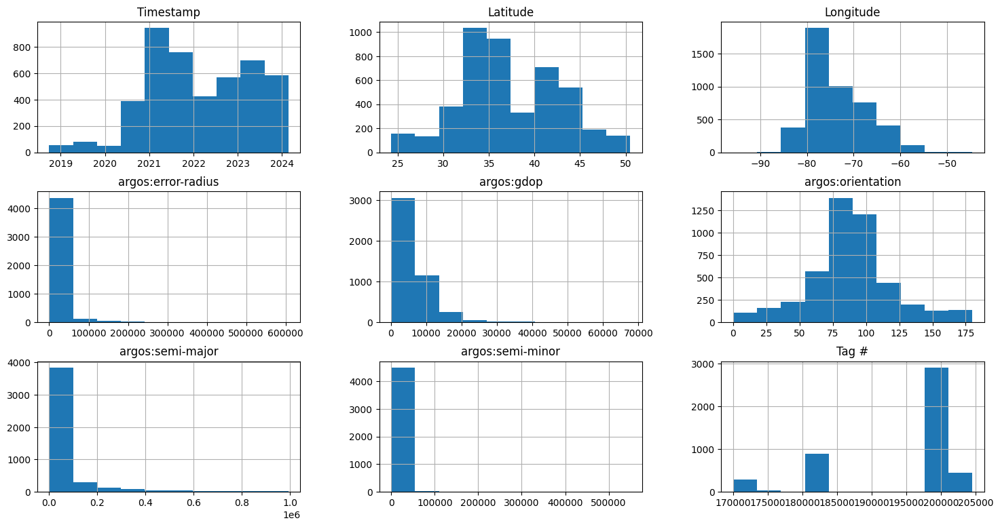

In [13]:
#Numeric Distribution

num_feature = df.select_dtypes(include="number").columns.to_list()
print(num_feature)

df.hist(figsize=(18,9))

### 4.2 Categorical Distribution


In [14]:
#Mode and categorical features

categorical_variables = [
    "Shark Name",
    "Sci. Name",
    "argos:lc",
    "Tag #"
]

df[categorical_variables].mode().T

,0
Shark Name,Gladee
Sci. Name,Carcharodon carcharias
argos:lc,B
Tag #,199478


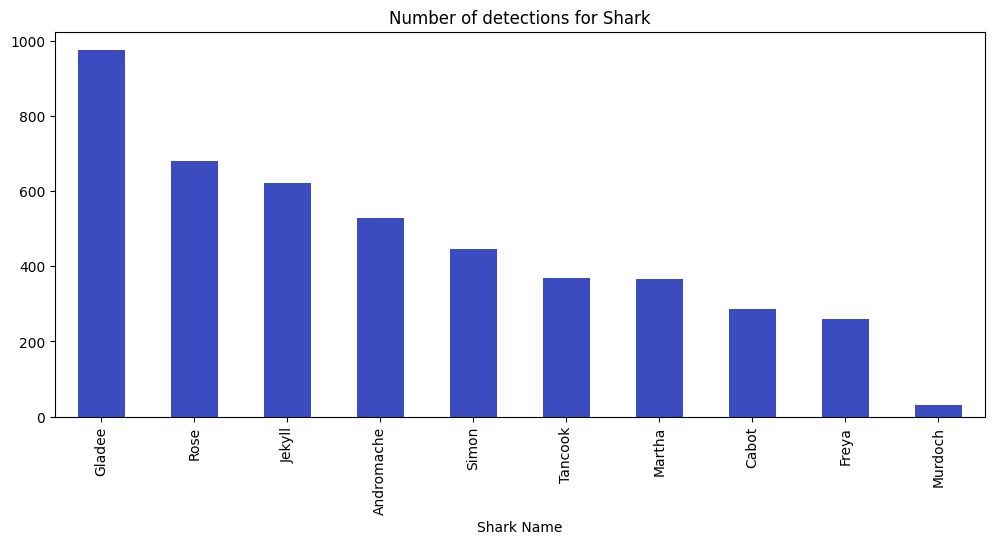

In [15]:
#Detections per Shark

df["Shark Name"].value_counts().plot(kind= "bar", figsize=(12,5), colormap= "coolwarm")
plt.title("Number of detections for Shark")
plt.show()

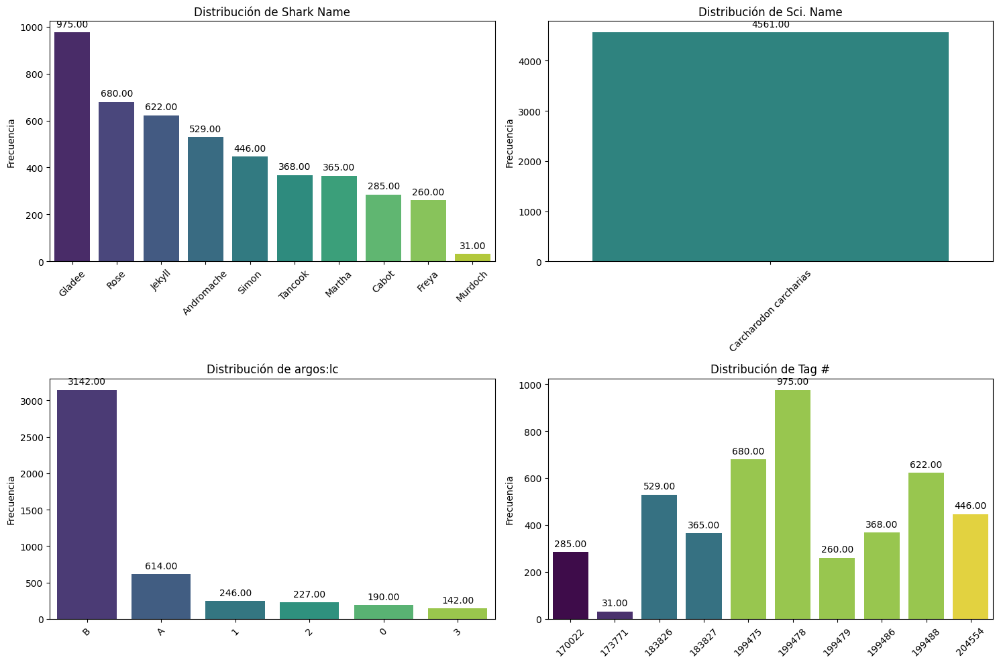

In [16]:
bt.pinta_distribucion_categoricas(df, categorical_variables, mostrar_valores= True)

### 4.3 Dates

In [17]:
#Dates rate
print(f"Dates: {df["Timestamp"].min()} - {df["Timestamp"].max()}")

Dates: 2018-09-27 16:12:00 - 2024-02-23 00:36:00


In [18]:
#Detections per month and year

df["year_month"] = df["Timestamp"].dt.month
det_per_month = df["year_month"].value_counts().sort_index()
print(det_per_month)

df["year"] = df["Timestamp"].dt.to_period("Y")
det_per_year = df["year"].value_counts().sort_index()
print(det_per_year)

year_month
1     292
2     350
3     416
4     385
5     299
6     309
7     316
8     152
9     380
10    781
11    502
12    379
Name: count, dtype: int64
year
2018      43
2019     125
2020     497
2021    1620
2022     926
2023    1251
2024      99
Freq: Y-DEC, Name: count, dtype: int64


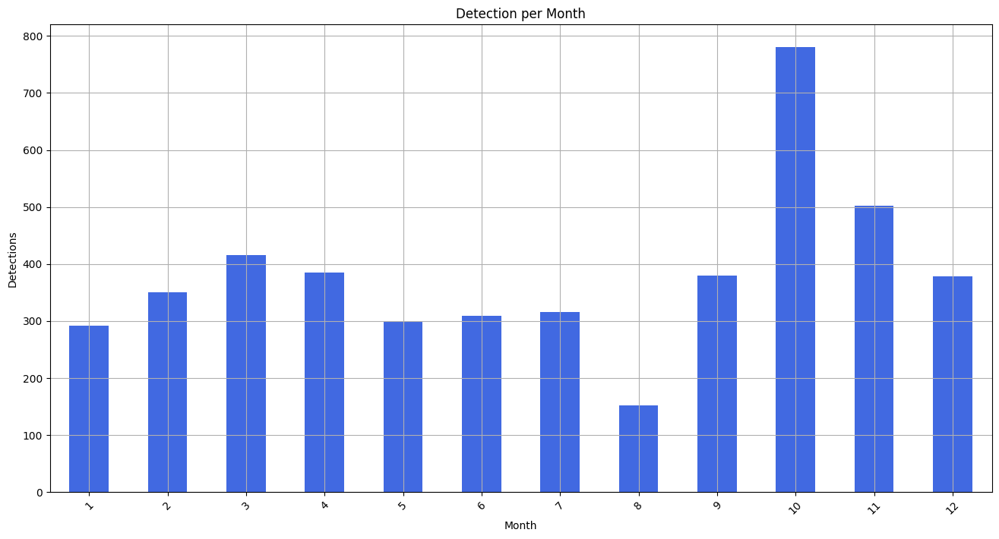

In [19]:
plt.figure(figsize=(16,8))
det_per_month.plot(kind= "bar", color = "royalblue")
plt.xticks(rotation = 45)
plt.xlabel("Month")
plt.ylabel("Detections")
plt.title("Detection per Month")
plt.grid(True)
plt.show()

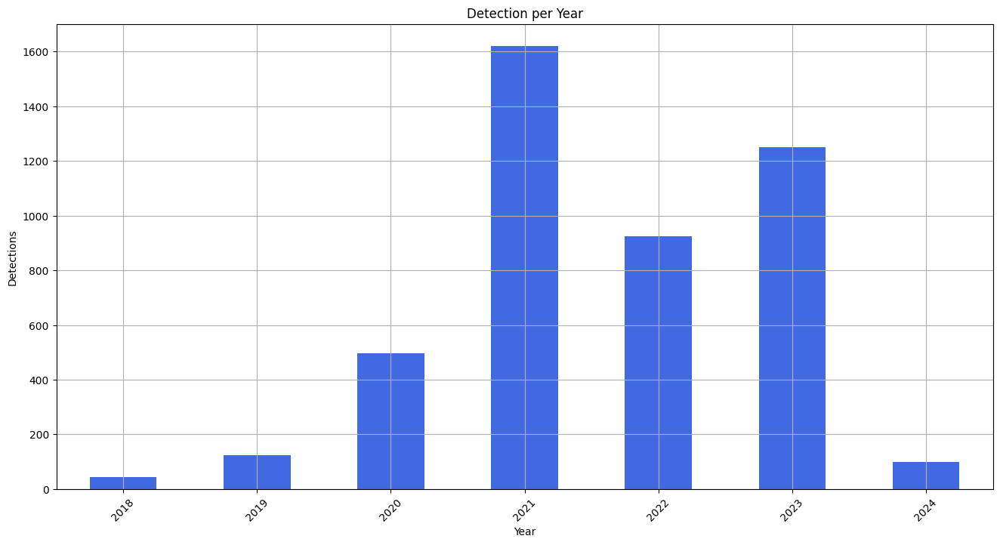

In [20]:
plt.figure(figsize=(16,8))
det_per_year.plot(kind= "bar", color = "royalblue")
plt.xticks(rotation = 45)
plt.xlabel("Year")
plt.ylabel("Detections")
plt.title("Detection per Year")
plt.grid(True)
plt.show()

Why? Why 2021 have over 1600 detections? Beacause the great part of them have they mark in 2020-2021

C:\Users\shark\AppData\Local\Temp\ipykernel_2328\3136588528.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=det_per_hour.index, y= det_per_hour.values, palette="viridis")


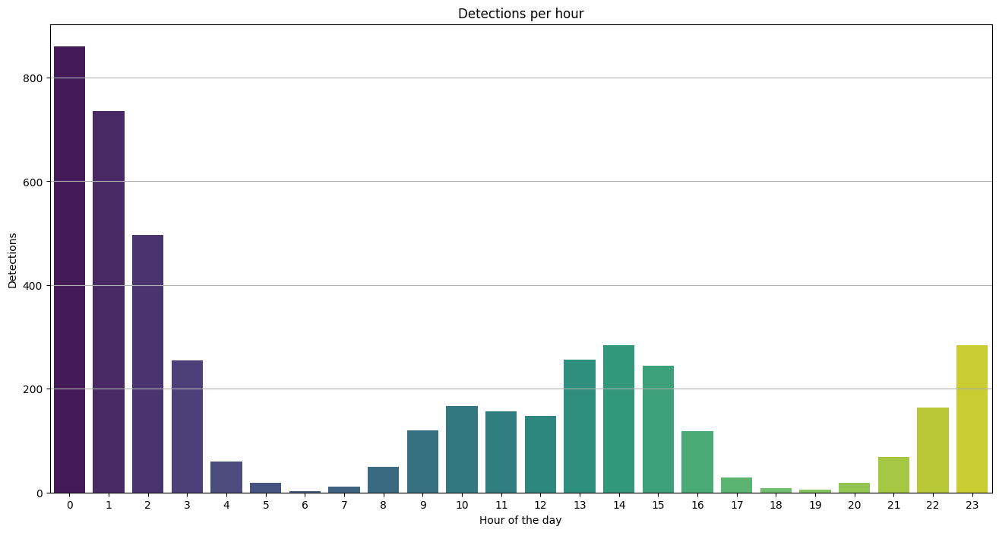

In [21]:
#Per Hour

df["Hour"] = df["Timestamp"].dt.hour

det_per_hour = df["Hour"].value_counts().sort_index()

plt.figure(figsize=(16,8))
sns.barplot(x=det_per_hour.index, y= det_per_hour.values, palette="viridis")
plt.xlabel("Hour of the day")
plt.ylabel("Detections")
plt.title("Detections per hour")
plt.grid(axis = "y")
plt.show()

This is something interesting. We can see that the detections are hourly, meaning they follow a cyclic schedule of intervals.

### 5. Multivariant Analisys

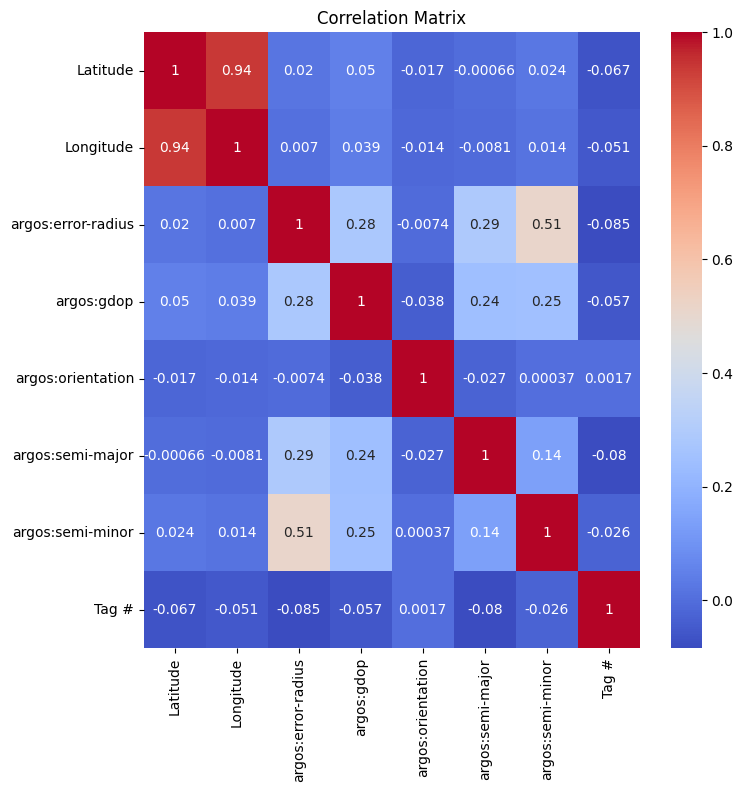

In [22]:
#Correlation features
corr_matrix = df[num_feature].corr()
plt.figure(figsize=(8,8))

sns.heatmap(corr_matrix, annot= True, cmap= "coolwarm")
plt.title("Correlation Matrix")
plt.show()

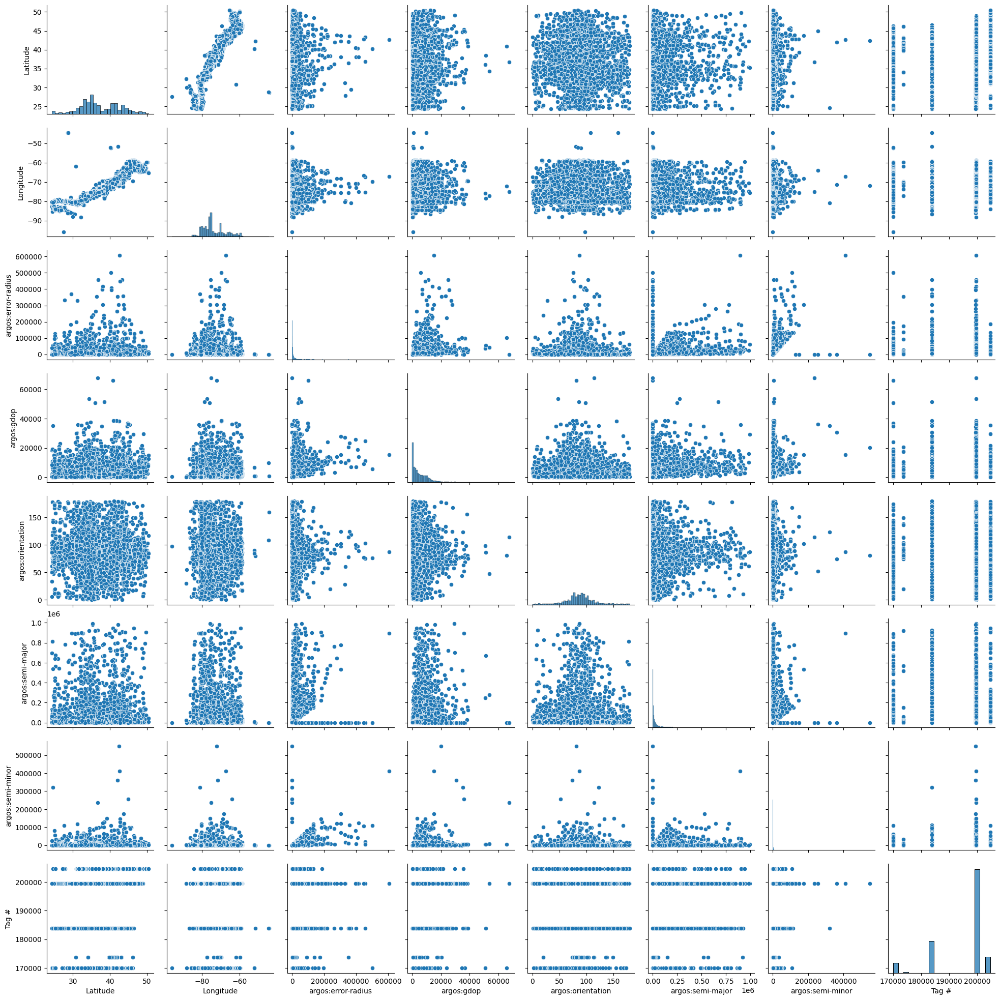

In [43]:
#Numeric Distribution between Features

sns.pairplot(df[num_feature]);

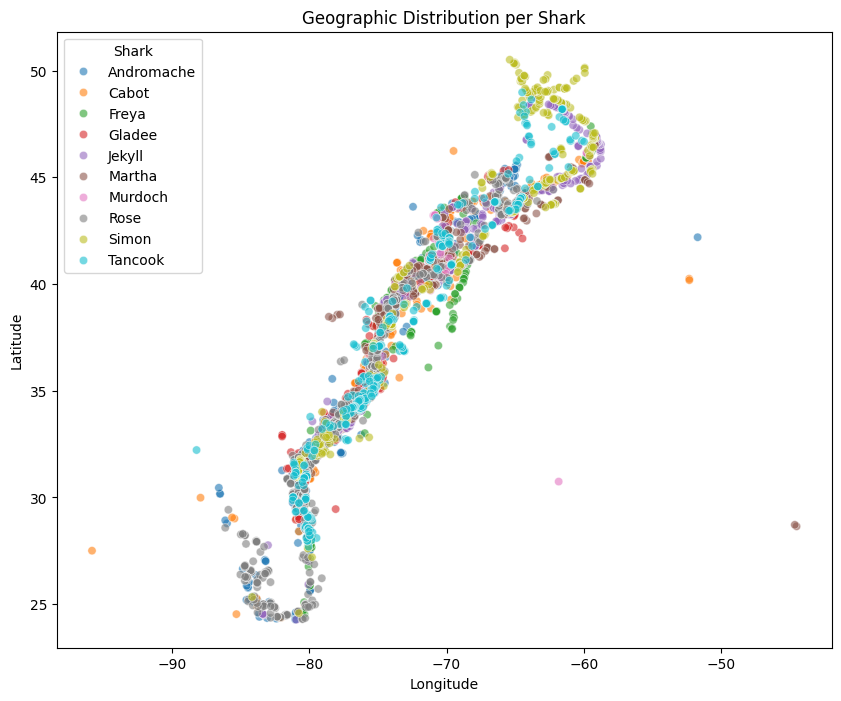

In [24]:
#Geographic distribution

plt.figure(figsize=(10,8))
sns.scatterplot(x=df["Longitude"], y= df["Latitude"], hue= df["Shark Name"], alpha = 0.6)
plt.title("Geographic Distribution per Shark")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title = "Shark")
plt.show()

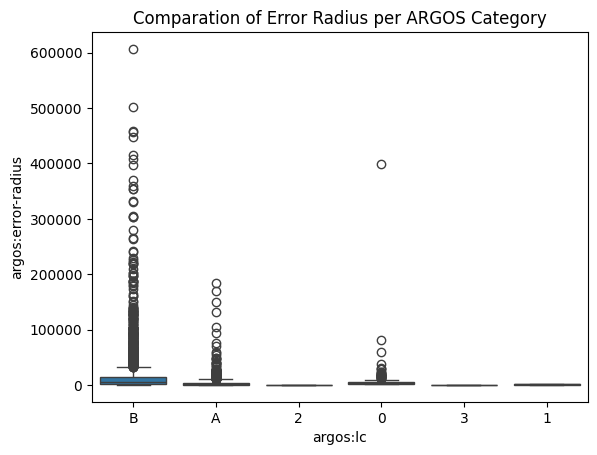

In [25]:
#Comparation of Error Radius per ARGOS Category

sns.boxplot(x= df["argos:lc"], y= df["argos:error-radius"])
plt.title("Comparation of Error Radius per ARGOS Category")
plt.show()

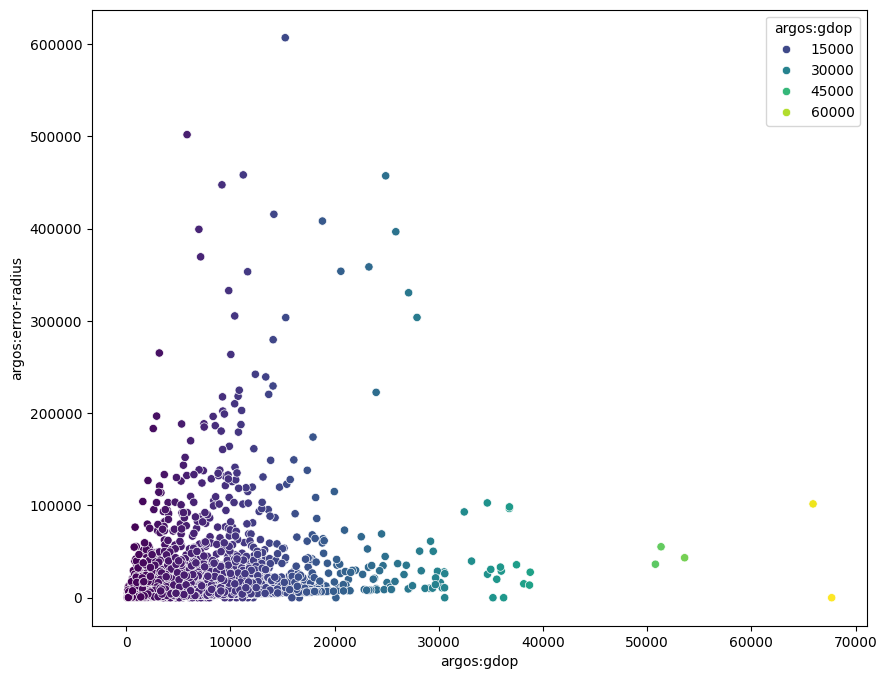

In [26]:
#Relation between argos:gdop and argos:error-radius

plt.figure(figsize=(10,8))
sns.scatterplot(x=df["argos:gdop"], y= df["argos:error-radius"], palette="viridis", hue= df["argos:gdop"])
plt.show()

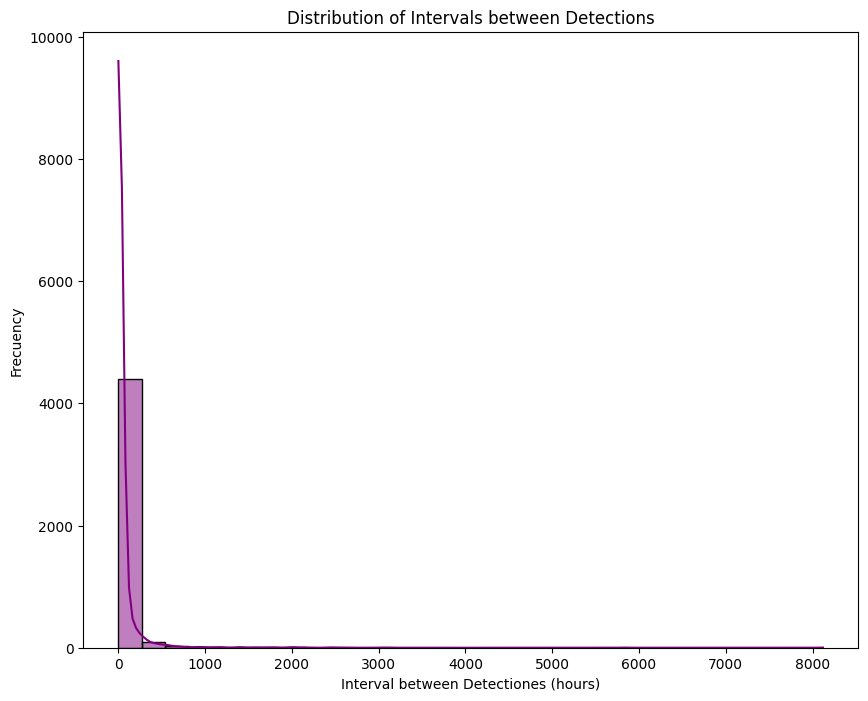

In [27]:
#Intervals between detections
df["Time_Diff"] = df.groupby("Shark Name")["Timestamp"].diff().dt.total_seconds() / 3600

plt.figure(figsize=(10,8))
sns.histplot(df["Time_Diff"].dropna(), bins= 30, kde= True, color= "purple")
plt.xlabel("Interval between Detectiones (hours)")
plt.ylabel("Frecuency")
plt.title("Distribution of Intervals between Detections")
plt.show()



C:\Users\shark\AppData\Local\Temp\ipykernel_2328\3680328428.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df["Hour"], y = df["Shark Name"], palette= "Set3")


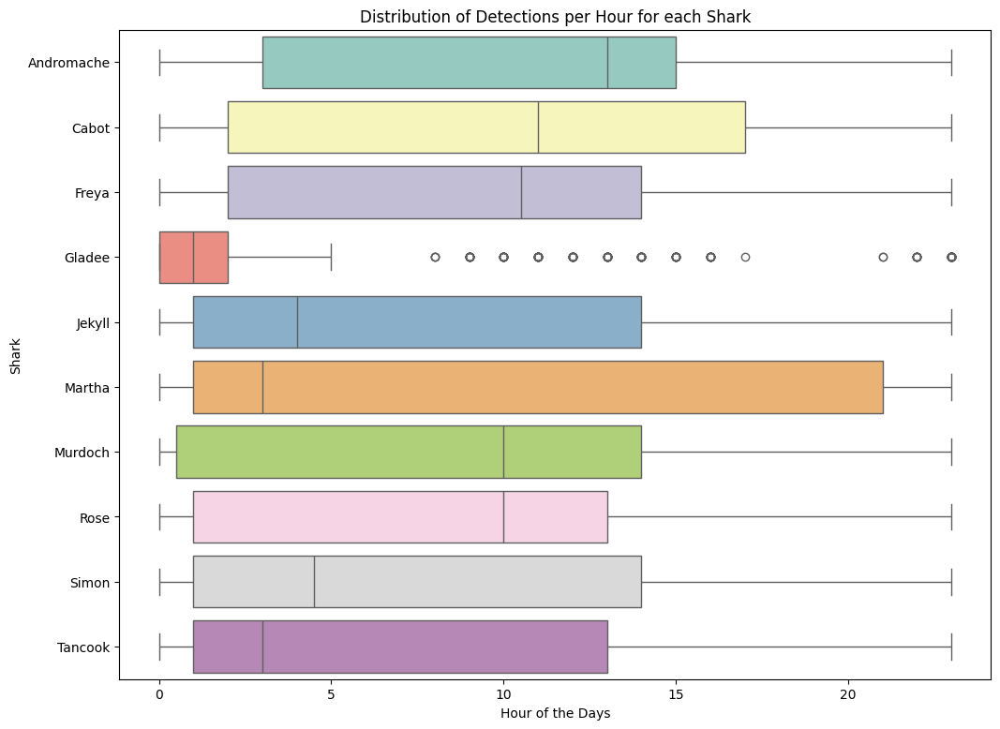

In [53]:
#Shark per Hour
plt.figure(figsize= (12,9))

sns.boxplot(x=df["Hour"], y = df["Shark Name"], palette= "Set3")

plt.xlabel("Hour of the Days")
plt.ylabel("Shark")
plt.title("Distribution of Detections per Hour for each Shark")
plt.show()

## 6. Maps and routes.

### We are going to view the shark routes with interactive maps.

In [29]:
#Detection Map

#Create the map
map = folium.Map(location=[df["Latitude"].mean(), df["Longitude"].mean()], zoom_start=6)


#Define colors like Shark Name
name_sharks = df["Shark Name"].unique()
palette = sns.color_palette("husl", len(name_sharks))
color_dict = {name: f"#{int(color[0]*255):02x}{int(color[1]*255):02x}{int(color[2]*255):02x}" for name, color in zip(name_sharks, palette)}

In [30]:
#Map

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius = 5,
        color= color_dict.get(row["Shark Name"], "gray"),
        fill = True,
        fill_color = color_dict.get(row["Shark Name"], "gray"),
        fill_opacity = 0.7,
        popup=f"Name: {row["Shark Name"]}<br>Hour: {row["Hour"]}"
        
    ).add_to(map)

In [31]:
#Legend
legend_html = """
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 200px;
    height: auto;
    background-color: white;
    z-index:9999;
    font-size:14px;
    border-radius: 10px;
    padding: 10px;
    box-shadow: 2px 2px 5px rgba(0,0,0,0.3);
">
    <b>🦈 Shark Names</b><br>
"""
for especie, color in color_dict.items():
    legend_html += f'<div style="display: flex; align-items: center;"><div style="width: 15px; height: 15px; background:{color}; margin-right: 5px; border-radius: 50%;"></div>{especie}</div>'

legend_html += "</div>"

map.get_root().html.add_child(folium.Element(legend_html))

In [32]:
map

In [33]:
#Heatmap of Detections

heatmap_data = df[["Latitude", "Longitude"]].values.tolist()

heatmap_map = folium.Map(location= [df["Latitude"].mean(), df["Longitude"].mean()], zoom_start=6)

In [34]:
HeatMap(heatmap_data, radius=10).add_to(heatmap_map)

heatmap_map

In [35]:
#Temporal + Geographic Analisys


temporal_map = folium.Map(location=[df["Latitude"].mean(), df["Longitude"].mean()], zoom_start=6)


In [36]:
#Define Colors per Month

months_palette = sns.color_palette("coolwarm", 12)
months_dict = {i+1: f"#{int(color[0]*255):02x}{int(color[1]*255):02x}{int(color[2]*255):02x}" for i, color in enumerate(months_palette)}

In [37]:
#Agregate colored points per month

for _, row in df.iterrows():
    folium.CircleMarker(
        location= [row["Latitude"], row["Longitude"]],
        radius = 5,
        color = months_dict.get(row["year_month"], "gray"),
        fill = True,
        fill_color = months_dict.get(row["year_month"], "gray"),
        fill_opacity = 0.7,
        popup=f"year_month: {row["year_month"]}<br>Name: {row["Shark Name"]}"
    ).add_to(temporal_map)

In [38]:
legend_html = """
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 200px;
    height: auto;
    background-color: white;
    z-index:9999;
    font-size:14px;
    border-radius: 10px;
    padding: 10px;
    box-shadow: 2px 2px 5px rgba(0,0,0,0.3);
">
    <b>📆 Month of Detection</b><br>
"""
for month, color in months_dict.items():
    legend_html += f'<div style="display: flex; align-items: center;"><div style="width: 15px; height: 15px; background:{color}; margin-right: 5px; border-radius: 50%;"></div>Month {month}</div>'

legend_html += "</div>"

temporal_map.get_root().html.add_child(folium.Element(legend_html))


In [39]:
temporal_map

In [40]:
#Desplacement Rutes

rute_map = folium.Map(location=[df["Latitude"].mean(), df["Longitude"].mean()], zoom_start=6)

palette = sns.color_palette("husl", len(name_sharks))
color_dict = {shark: f"#{int(color[0]*255):02x}{int(color[1]*255):02x}{int(color[2]*255):02x}" for shark, color in zip(name_sharks, palette)}

In [41]:
for shark in name_sharks:
    shark_group = folium.FeatureGroup(name=shark)
    shark_data = df[df["Shark Name"] == shark]
    coordinates = list(zip(shark_data["Latitude"], shark_data["Longitude"]))
    
    if len(coordinates) > 1:
        folium.PolyLine(
            locations= coordinates,
            color = color_dict[shark], 
            weight = 2.5, 
            opacity = 0.7, 
            popup=f"Rute of {shark}"
        ).add_to(shark_group)
        
        folium.Marker(
            location=coordinates[0],
            icon= folium.Icon(color="green", icon = "play", prefix="fa"),
            popup=f"Start - {shark}"
        ).add_to(shark_group)
        
        folium.Marker(
            location= coordinates[-1],
            icon= folium.Icon(color="red", icon="stop", prefix="fa"),
            popup=f"End - {shark}"
        ).add_to(shark_group)
    
    shark_group.add_to(rute_map)

folium.LayerControl(collapsed=False).add_to(rute_map)
        

In [42]:
rute_map


# 🦈 **Key Takeaways: White Shark Migration**  

🌍 **Epic Journeys**  
These ten juvenile sharks navigate between **southern Canada** and the **Gulf of Mexico**, hugging the **East Coast of North America**. Their migrations span **one to two years**, with occasional detours into the open ocean—only to turn back. 🔄  

❄️ **Why Stick to the Coast?**  
- Rich **seal populations** provide an easy food source.   
- **Cold water currents** drive their movements northward. 🌊  

🔥 **Where Are the Hotspots?**  
The highest detection rates occur in **North Carolina and Virginia Beach**, making them critical zones for shark activity.  

📅 **When Are They Most Active?**  
- **Fall & winter months** see peak detections. 🍂❄️  
- **Nighttime hours** show a spike in movement. 🌙  

🦈 **Juvenile Survival Strategy**  
Being young, these sharks stick to **coastal waters**, where prey (seals, fish…) is abundant. Their movements strongly align with **prey availability**, ensuring their survival. 🐠🔎  

🚢 **A Human Connection?**  
Activity increases when **fishing boats leave the coast**, suggesting that these sharks adjust their movements to avoid human presence.  


# 🙌 **Acknowledgements**

I want to express my gratitude to **OCEARCH** for providing the data and collaborating on this project. Their support has been invaluable in making this research possible. 🦈📊

I hope this project contributes to the **conservation and protection** of these incredible animals, ensuring a future where they continue to thrive. 🌊💙